In [ ]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0" #set to -1 to use CPU
import torch
from pipelines.pipeline_cogvideox_image2video import CogVideoXImageToVideoPipeline
from diffusers.utils import export_to_gif, export_to_video, load_image, make_image_grid
from PIL import Image
import decord
from IPython import display

pipe = CogVideoXImageToVideoPipeline.from_pretrained(
    "THUDM/CogVideoX1.5-5B-I2V",
    torch_dtype=torch.bfloat16
)
pipe = pipe.to("cuda")
pipe.transformer.enable_gradient_checkpointing()

# pipe.enable_sequential_cpu_offload() # it needs to be enabled for the model to run on A6000
pipe.vae.enable_tiling()
pipe.vae.enable_slicing()
pipe.vae.enable_gradient_checkpointing()

In [2]:
# video load
def make_frames(path):
    frames = []
    vr = decord.VideoReader(path)
    for i in range(len(vr)):
        frames.append(Image.fromarray(vr[i].asnumpy()))
    return frames

# parse frame numbers
def parse_line_to_list(line: str) -> list:
    """
    parse_line_to_list("1,3,4") -> [1, 3, 4]
    parse_line_to_list("1-3,4") -> [1, 2, 3, 4]
    """
    result = []
    parts = line.split(',')
    
    for part in parts:
        part = part.strip()
        if '-' in part:
            start_str, end_str = part.split('-')
            start, end = int(start_str), int(end_str)
            result.extend(range(start, end + 1))
        else:
            result.append(int(part))
    
    return result

In [3]:
init = Image.open("examples/train/0.png")
mid = Image.open("examples/train/25.png")
last = Image.open("examples/train/48.png")

video_init = [None] * 49
video_init[:17] = [init] * 17
video_init[17:33] = [mid] * 16
video_init[33:] = [last] * 16

  0%|          | 0/50 [00:00<?, ?it/s]

total_loss 0.6020078063011169
total_loss 0.5028843879699707
total_loss 0.4832533299922943
total_loss 0.44421255588531494
total_loss 0.43398723006248474
total_loss 0.40131866931915283
total_loss 0.3908599019050598
total_loss 0.35618239641189575
total_loss 0.34809592366218567
total_loss 0.3149244785308838


  2%|▏         | 1/50 [02:34<2:06:00, 154.30s/it]

total_loss 0.4429151117801666
total_loss 0.29346323013305664
total_loss 0.286052405834198
total_loss 0.29561007022857666
total_loss 0.273825466632843
total_loss 0.2784944176673889
total_loss 0.23994937539100647
total_loss 0.23285150527954102
total_loss 0.25494420528411865
total_loss 0.21645644307136536


  4%|▍         | 2/50 [05:09<2:03:48, 154.77s/it]

total_loss 0.36956384778022766
total_loss 0.3356205224990845
total_loss 0.22481687366962433
total_loss 0.23988661170005798
total_loss 0.2091158777475357
total_loss 0.2123262584209442
total_loss 0.2036338746547699
total_loss 0.19612975418567657
total_loss 0.19005388021469116
total_loss 0.1876634955406189


  6%|▌         | 3/50 [07:43<2:01:00, 154.49s/it]

total_loss 0.4200105667114258
total_loss 0.2511356472969055
total_loss 0.1931946575641632
total_loss 0.21879702806472778
total_loss 0.178754061460495
total_loss 0.20741227269172668
total_loss 0.19208478927612305
total_loss 0.1838352382183075
total_loss 0.1864880472421646
total_loss 0.19160529971122742


  8%|▊         | 4/50 [10:18<1:58:29, 154.55s/it]

total_loss 0.2849062383174896
total_loss 0.20184749364852905
total_loss 0.25689685344696045
total_loss 0.18357494473457336
total_loss 0.21037685871124268
total_loss 0.22248485684394836
total_loss 0.18533611297607422
total_loss 0.176327645778656
total_loss 0.18228235840797424
total_loss 0.1980709731578827


 10%|█         | 5/50 [12:55<1:56:32, 155.38s/it]

total_loss 0.1938174068927765
total_loss 0.24472153186798096
total_loss 0.2966150641441345
total_loss 0.4503566026687622
total_loss 0.4697158932685852


 12%|█▏        | 6/50 [14:14<1:34:56, 129.47s/it]

total_loss 0.3957110345363617
total_loss 0.376760870218277
total_loss 0.39482539892196655
total_loss 0.3597513437271118
total_loss 0.688361406326294


 14%|█▍        | 7/50 [15:32<1:20:46, 112.70s/it]

total_loss 0.3687435984611511
total_loss 0.3947814702987671
total_loss 0.4860506057739258
total_loss 0.6010140180587769
total_loss 0.4975854754447937


 16%|█▌        | 8/50 [16:51<1:11:19, 101.90s/it]

total_loss 0.3599473237991333
total_loss 0.40477561950683594
total_loss 0.42261338233947754
total_loss 0.361412912607193
total_loss 0.3787147104740143


 18%|█▊        | 9/50 [18:09<1:04:31, 94.42s/it] 

total_loss 0.31771406531333923
total_loss 0.37264060974121094
total_loss 0.3738330006599426
total_loss 0.36655429005622864
total_loss 0.3413209617137909


 20%|██        | 10/50 [19:26<59:27, 89.19s/it] 

total_loss 0.32899901270866394
total_loss 0.30834081768989563


 22%|██▏       | 11/50 [19:59<46:44, 71.91s/it]

total_loss 0.36617496609687805
total_loss 0.339644193649292


 24%|██▍       | 12/50 [20:31<37:57, 59.94s/it]

total_loss 0.34851163625717163
total_loss 0.34845781326293945


 26%|██▌       | 13/50 [21:04<31:49, 51.61s/it]

total_loss 0.31039875745773315
total_loss 0.30383944511413574


 28%|██▊       | 14/50 [21:37<27:37, 46.03s/it]

total_loss 0.30766528844833374
total_loss 0.29053452610969543


 30%|███       | 15/50 [22:10<24:36, 42.18s/it]

total_loss 0.28716376423835754
total_loss 0.29114818572998047


 32%|███▏      | 16/50 [22:42<22:08, 39.08s/it]

total_loss 0.28714919090270996
total_loss 0.2837417721748352


 34%|███▍      | 17/50 [23:15<20:32, 37.35s/it]

total_loss 0.27626267075538635
total_loss 0.27873924374580383


 36%|███▌      | 18/50 [23:48<19:07, 35.86s/it]

total_loss 0.2743324041366577
total_loss 0.27299052476882935


 38%|███▊      | 19/50 [24:21<18:06, 35.06s/it]

total_loss 0.271522581577301
total_loss 0.2682519853115082


100%|██████████| 50/50 [25:58<00:00, 31.18s/it]


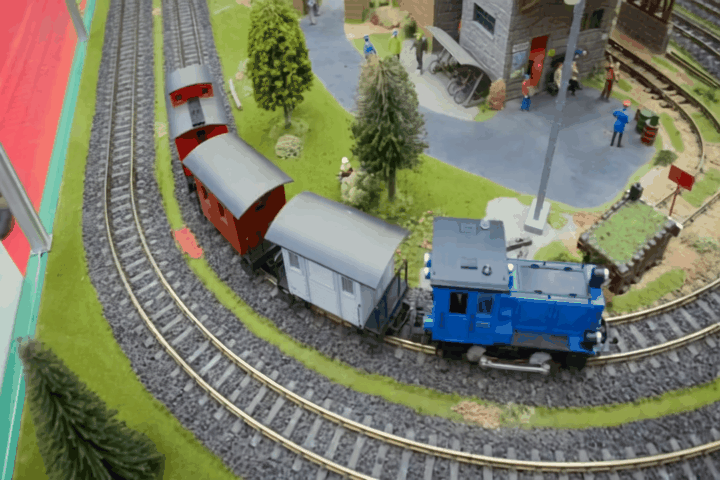

In [5]:
# base - gaussian noise
seed = 0
# set_seed(seed)
st = 0.95 # V2V strength (st=1.0 mean starting from random gaussian noise)
prompt = "A vibrant blue model train gracefully traverses a detailed miniature landscape with precision and charm. The train, featuring a colorful mix of red, gray, and blue cars, winds its way along meticulously crafted tracks that curve through a quaint scene. Model trees and buildings populate the background, adding depth and realism. Tiny figures of people animate the scene, creating a bustling miniature world. The camera follows the train in a smooth, continuous motion, capturing every detail of its journey through this carefully constructed environment. Occasional slow-motion shots emphasize the intricate details and craftsmanship, bringing the idyllic miniature setting to life."

guidance_lr = [3e0] * 5 + [3e0] * 45
guidance_step = [10]* 5 + [5] * 5 + [2] * 10 + [0] * 30

travel_time = (5, 20) # in paper we use (5, 20), but applying time-travel in later timesteps (ex: (7, 20)) for better details (early time-travel causes detail drop)
fixed_frames = "25,48" # 48 means the last frame
fixed_frames_ = parse_line_to_list(fixed_frames) # makes it a list of frame numbers

save_dir = "results/train.gif"
video = pipe(
    prompt=prompt,
    video=video_init, # first frame is used as the initial image automatically (no input image needed)
    num_videos_per_prompt=1,
    num_inference_steps=50,
    guidance_scale=6,
    generator=torch.Generator(device="cuda").manual_seed(seed),
    strength=st,
    fixed_frames=fixed_frames_,
    guidance_step=guidance_step,
    guidance_lr=guidance_lr,
    loss_fn="frame",
    travel_time=travel_time,
).frames[0]

export_to_gif(video, save_dir, fps=8)
display.Image(filename=save_dir)